In [166]:
import json
import pandas as pd
import pickle
import numpy as np
import matplotlib.pyplot as plt
import heapq
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import re
import collections
import matplotlib.cm as cm
from matplotlib import rcParams
from textblob import TextBlob
import seaborn as sns
from pandas import *

from tqdm import tqdm
from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')

nltk.download('wordnet')
import nltk
from nltk.stem import WordNetLemmatizer 

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/crystal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/crystal/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [167]:
# libraries for topic modeling

# spacy for lemmatization
import spacy; spacy.load('en')


# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
from pprint import pprint
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)
#radar chart
import math 
import plotly.express as px

# Extract information of Chipotle Mexican Grill from all Yelp restuarants

In [3]:
# convert json file into list
business = []
for line in open('business.json', 'r'):
    business.append(json.loads(line))

# convert list into dataframe
business = pd.DataFrame(business)

In [4]:
# convert json file into list
reviews = []
for line in open('review.json', 'r'):
    reviews.append(json.loads(line))

In [5]:
# convert list into dataframe
review = pd.DataFrame(reviews)

In [6]:
# remove useless columns and merge two tables
business_drop = business.drop(labels = {'address', 'postal_code', 'latitude', 'longitude', 'attributes', 'hours'}, axis = 1)
data_navie = pd.merge(business_drop, review, on="business_id", how="right")

In [7]:
Chipotle = data_navie[data_navie['name']=='Chipotle Mexican Grill']
Chipotle.to_csv('Chipotle.csv')

# EDA

In [3]:
Chipotle = read_csv('Chipotle.csv')

#drop columns that we do not need
Chipotle =Chipotle.drop(['Unnamed: 0', 'name', 'categories', 'user_id', 'review_id'], axis=1)

In [4]:
#separate date and time
Chipotle['time']= Chipotle['date'].apply(lambda x: x.split()[1])
Chipotle['date']= Chipotle['date'].apply(lambda x: x.split()[0])
Chipotle['date'] = pd.to_datetime(Chipotle['date'])
Chipotle['year'] = Chipotle['date'].dt.to_period('Y')
Chipotle['month'] = Chipotle['date'].dt.month
Chipotle['year_month'] = Chipotle['date'].dt.to_period('M')

In [5]:
len(Chipotle[(Chipotle['year']>= 2011) & (Chipotle['year_month']< '2018-11')])/len(Chipotle)

0.9412930135557873

In [6]:
# # just keep the rows from 2011.01 to 2018.10
# Chipotle = Chipotle[(Chipotle['year']>= 2011) & (Chipotle['year_month']< '2018-11')]

In [7]:
Chipotle.head(2)

,business_id,city,state,stars_x,review_count,is_open,stars_y,useful,funny,cool,text,date,time,year,month,year_month
0,dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,1.0,1,0,0,"I'm a regular at chipotle in California, this ...",2016-07-25,05:07:18,2016,7,2016-07
1,dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,4.0,0,0,0,The food tasted the same as Chipotle back in m...,2012-09-10,15:44:21,2012,9,2012-09


In [8]:
print("Number of Stores: ",len(Chipotle["business_id"].value_counts()))
print("Number of Opening Stores: ",len(Chipotle[Chipotle['is_open']==1]["business_id"].value_counts()))
print("Number of Reviews: ",len(Chipotle))

Number of Stores:  183
Number of Opening Stores:  175
Number of Reviews:  9590


Text(0.5, 1.0, 'Number of Different Stars Change over Time')

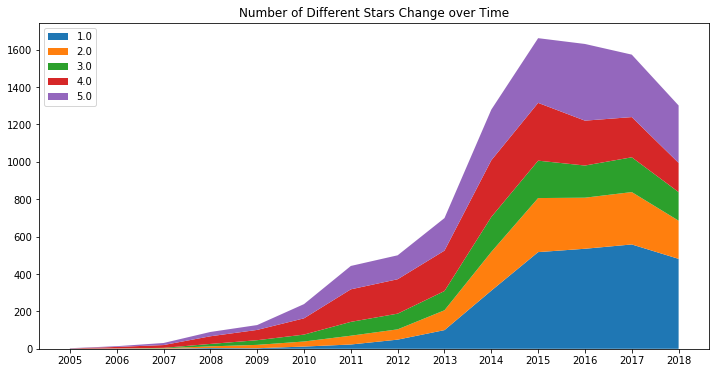

In [9]:
pivot = pd.pivot_table(Chipotle, index=['stars_y'],
                         columns=['year'],
                         values=['text'], 
                         aggfunc = lambda x: len(x), 
                         fill_value=0)


fig= plt.figure(figsize = (12,6))
plt.stackplot([2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018], pivot.values, labels = pivot.index)
ax = plt.gca()
ax.set_xticks([2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018])
plt.legend(loc='upper left')
plt.title('Number of Different Stars Change over Time')


(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150]),
 <a list of 151 Text xticklabel objects>)

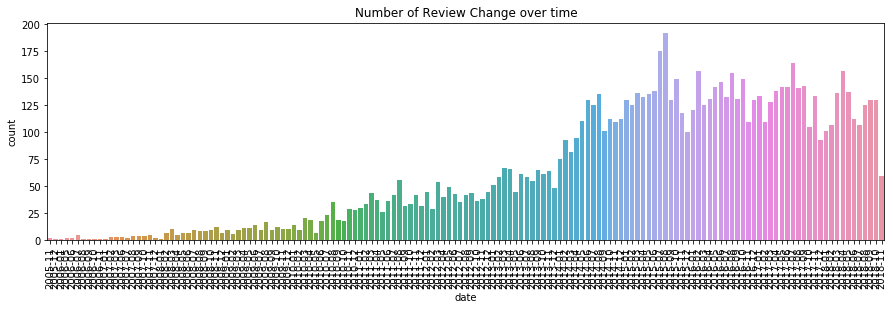

In [10]:
fig= plt.figure(figsize = (15,4))
sns.countplot(Chipotle['date'].dt.to_period('M'), order = np.unique(Chipotle['date'].dt.to_period('M')))
plt.title('Number of Review Change over time')
plt.xticks(rotation = 90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text xticklabel objects>)

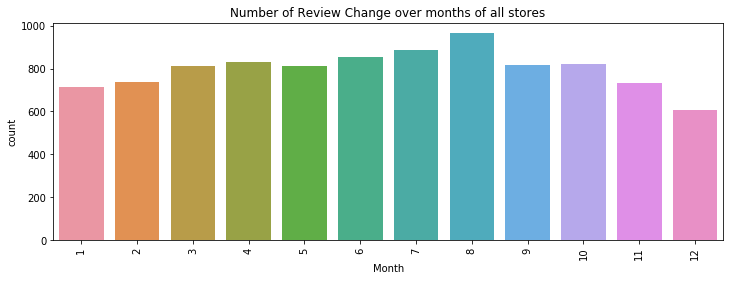

In [11]:
month = list(pd.DatetimeIndex(Chipotle['date']).month)
month.sort()
fig= plt.figure(figsize = (12,4))
sns.countplot(pd.DatetimeIndex(Chipotle['date']).month, order = np.unique(month))
plt.title('Number of Review Change over months of all stores')
plt.xlabel('Month')
plt.xticks(rotation = 90)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100]),
 <a list of 101 Text xticklabel objects>)

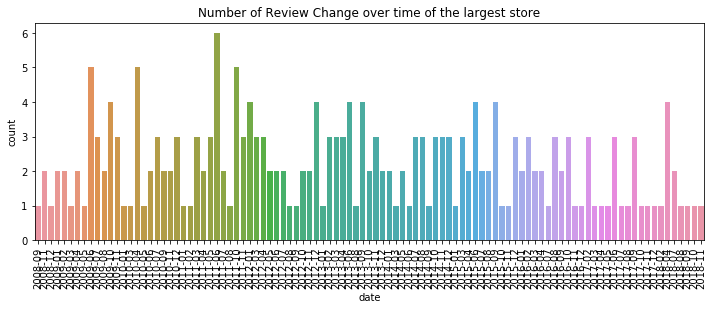

In [12]:
largest_store = Chipotle[Chipotle["business_id"] =="gOBxVkHpqtjRRxHBIrpnMA"]
year_month_large_store = list(largest_store['date'].dt.to_period('M'))
year_month_large_store.sort()
fig= plt.figure(figsize = (12,4))
sns.countplot(largest_store['date'].dt.to_period('M'), order = np.unique(year_month_large_store))
plt.title('Number of Review Change over time of the largest store')
plt.xticks(rotation = 90)

([], <a list of 0 Text xticklabel objects>)

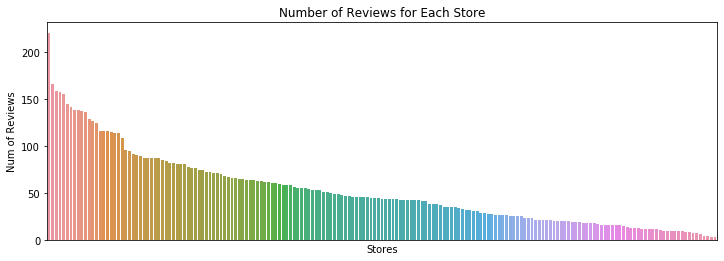

In [13]:
fig= plt.figure(figsize = (12,4))
sns.countplot(Chipotle["business_id"],order = Chipotle["business_id"].value_counts().index)
plt.title('Number of Reviews for Each Store')
plt.xlabel("Stores")
plt.ylabel("Num of Reviews")
plt.xticks([])

(array([0, 1, 2, 3, 4, 5, 6, 7]), <a list of 8 Text xticklabel objects>)

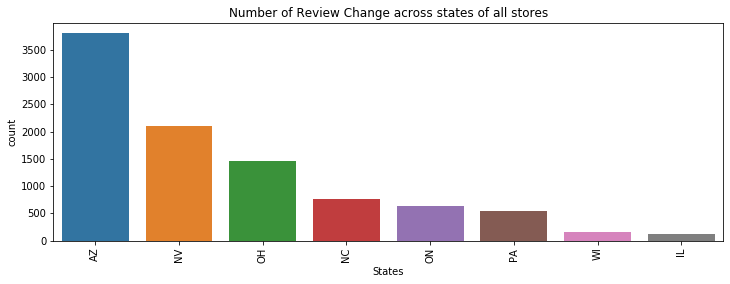

In [14]:
fig= plt.figure(figsize = (12,4))
sns.countplot(Chipotle['state'],order = Chipotle["state"].value_counts().index)
plt.title('Number of Review Change across states of all stores')
plt.xlabel('States')
plt.xticks(rotation = 90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]),
 <a list of 30 Text xticklabel objects>)

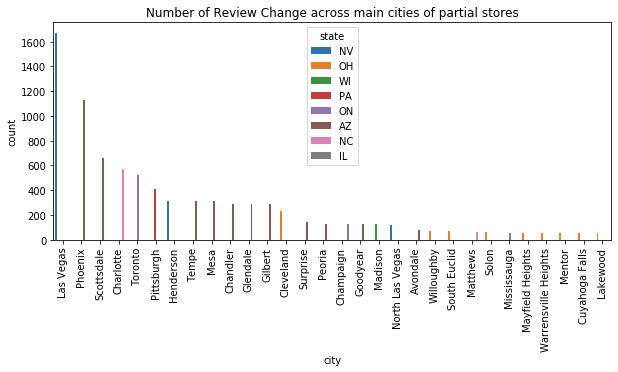

In [15]:
main_cities = list(Chipotle["city"].value_counts().index[0:30])
Chipotle_main_cities = Chipotle[Chipotle['city'].isin(main_cities)]

fig= plt.figure(figsize = (10,4))
sns.countplot(Chipotle_main_cities['city'],order = Chipotle_main_cities["city"].value_counts().index, hue = Chipotle_main_cities['state'])
plt.title('Number of Review Change across main cities of partial stores')
plt.xlabel('city')
plt.xticks(rotation = 90)

# Text Preprocessing

In [16]:
Chipotle['text'][0]

"I'm a regular at chipotle in California, this is my first visit to this chipotle on s.las Vegas strip.this is pretty new place I think, I took a veggie bowl in which the rice was undone and the fajitas were all burnt, the quantity offered was less than usual. I'm very unhappy with this place."

In [17]:
#decontraction
def decontracted(phrase):
    # specific
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r"didn\'t", "did not", phrase)
    phrase = re.sub(r"don\'t", "do not", phrase)
    phrase = re.sub(r"o\'clock", "clock", phrase)
    phrase = re.sub(r"couldn\'t", "could not", phrase)
    phrase = re.sub(r"that\'s", "that is", phrase)       
    phrase = re.sub(r"go-around", "go around", phrase)  
    # general
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    #phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
# return to words
Chipotle['review'] = Chipotle['text'].apply(lambda x: decontracted(x))

# to lower
Chipotle['review'] = Chipotle['review'].apply(lambda x: x.lower())

# remove stop words

stop_words = set(stopwords.words('english'))
not_stopwords = {'no','nor','not'} 
final_stop_words = set([word for word in stop_words if word not in not_stopwords])
# stop_words = stopwords.words('english')
Chipotle['review'] = Chipotle['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in final_stop_words]))

# remove non-word and punctuations
rm_punc = re.compile(r"\W")
shrink_spaces = re.compile(r"\s+")
Chipotle['review'] = Chipotle['review'].apply(lambda x: rm_punc.sub(' ', x))
Chipotle['review'] = Chipotle['review'].apply(lambda x: shrink_spaces.sub(' ', x))

In [19]:
# # handle negation
# sub_nt = re.compile(r"n't")
# handle_not = re.compile(r"not (?=[a-zA-Z]+)")
# df['text'] = df['text'].apply(lambda x: sub_nt.sub(r' not', x))
# df['text'] = df['text'].apply(lambda x: handle_not.sub(r'not_', x))

In [20]:
lemmatizer = WordNetLemmatizer() 
# lemmantize
Chipotle['review'] = Chipotle['review'].apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))

In [21]:
Chipotle['review'].iloc[0]

'regular chipotle california first visit chipotle s la vega strip this pretty new place think took veggie bowl rice undone fajitas burnt quantity offered le usual unhappy place'

# Sentiment Analysis

In [22]:
Chipotle['sentiment_socre'] = Chipotle['review'].map(lambda text: TextBlob(text).sentiment.polarity)

Chipotle['sentiment'] = ''
Chipotle['sentiment'][Chipotle['sentiment_socre'] > 0] = 'positive'
Chipotle['sentiment'][Chipotle['sentiment_socre'] <= 0] = 'negative'

/Users/crystal/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/Users/crystal/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


Text(0.5, 1.0, 'Review Sentiments')

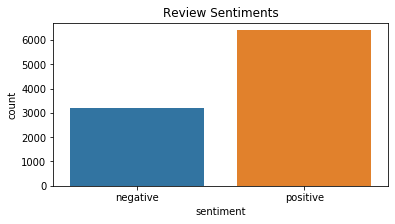

In [23]:
plt.figure(figsize=(6,3))
ax = sns.countplot(Chipotle['sentiment'])
plt.title('Review Sentiments')

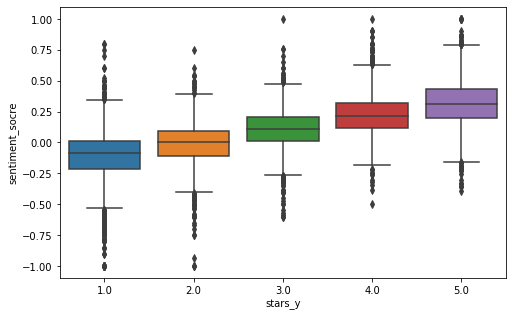

In [24]:
plt.figure(figsize=(8,5))
sns.boxplot(x ='stars_y',y='sentiment_socre',data = Chipotle)

### Collect Reviews and Count Words

In [65]:
review_list_ch = Chipotle['review'].tolist()
review_all_ch = ' '.join(review_list_ch)
word_list_ch = [word for word in review_all_ch.lower().split() if word not in STOPWORDS]
counted_words = collections.Counter(word_list_ch)
words = []
counts = []
for letter, count in counted_words.most_common(50):
    words.append(letter)
    counts.append(count)

### Calculate Word Occurence Ratio in Positive / Negative Reviews

In [66]:
pcount = []
ncount = []
for word in words:
    pcount.append(sum(Chipotle[Chipotle['sentiment'] == "positive"]["text"].str.contains(word)))
    ncount.append(sum(Chipotle[Chipotle['sentiment'] == "negative"]["text"].str.contains(word)))

In [67]:
pcount_normalized = np.asarray(pcount)/Chipotle.loc[Chipotle['sentiment'] == "positive"].shape[0]
ncount_normalized = np.asarray(ncount)/Chipotle.loc[Chipotle['sentiment'] == "negative"].shape[0]

In [68]:
word_pos_neg_cnt_df = pd.DataFrame({'positive ratio': pcount_normalized, 'negative ratio': ncount_normalized}, index=words)
word_pos_neg_cnt_df.head()

,positive ratio,negative ratio
chipotle,0.175704,0.246653
food,0.505150,0.408969
location,0.368676,0.366466
burrito,0.293244,0.253012
time,0.366101,0.390562


# Time Series Sentiment Analysis

## Preliminary Analysis

### Take Stars vs Date

In [69]:
df_ch_star = Chipotle[['stars', 'date']]
df_ch_star.head()

,stars,date
0,1,2016-07-25 05:07:18
1,5,2014-12-17 17:37:38
2,2,2013-11-14 04:23:42
3,3,2015-03-04 20:05:34
4,4,2016-01-04 05:09:53


### Convert to Monthly Change

In [71]:
ch_star_monthly_change = df_ch_star.set_index('date').resample('M').stars.mean()
ch_star_monthly_change = ch_star_monthly_change.dropna()
ch_star_monthly_change.head()
# df_ch.set_index('date').groupby('sentiment').get_group('positive').resample('M').count().sentiment

TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'

In [25]:
df_ch.shape[0]

9590

### Stars vs Month

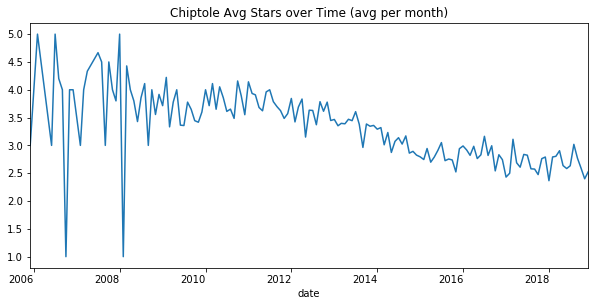

In [27]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

# ch_star_monthly_change = df_ch_star_vs_date.groupby(pd.Grouper(freq='30D', base=0, label='right')).mean()
ch_star_monthly_change.plot.line(label='Stars', ax=ax, rot=0, figsize=(10, 5), title="Chiptole Avg Stars over Time (avg per month)")

### Total positive / negative reviews per month

In [28]:
# monthly total positive rows
df_ch_pos_cnt = df_ch.set_index('date').groupby('sentiment').get_group('positive').resample('M').count().sentiment
df_ch_neg_cnt = df_ch.set_index('date').groupby('sentiment').get_group('negative').resample('M').count().sentiment
print(df_ch_pos_cnt.head())
print()
print(df_ch_neg_cnt.head())

date
2005-11-30    2
2005-12-31    1
2006-01-31    1
2006-02-28    0
2006-03-31    0
Freq: M, Name: sentiment, dtype: int64

date
2006-05-31    1
2006-06-30    0
2006-07-31    0
2006-08-31    0
2006-09-30    0
Freq: M, Name: sentiment, dtype: int64


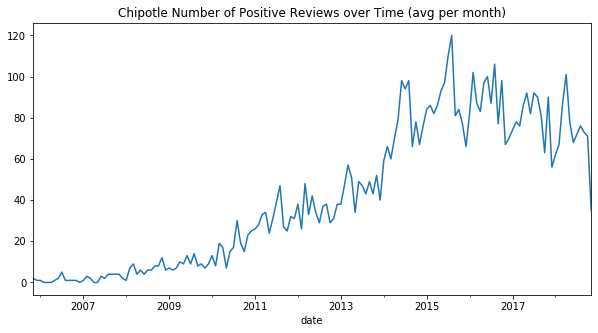

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
df_ch_pos_cnt.plot.line(label='Number of Positive Reviews', ax=ax, rot=0, figsize=(10, 5), title="Chipotle Number of Positive Reviews over Time (avg per month)", style='-')

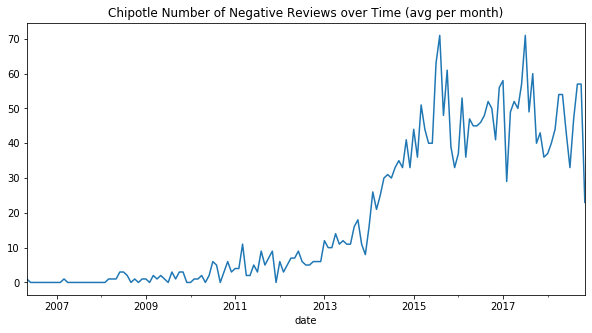

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
df_ch_neg_cnt.plot.line(label='Number of Negative Reviews', ax=ax, rot=0, figsize=(10, 5), title="Chipotle Number of Negative Reviews over Time (avg per month)", style='-')

## Occurence of top frequent word in positive / negative reviews per month: step by step

### Pick a word as example

In [31]:
# current woi (word of interest)
idx = 1
words[idx]

'food'

### All reviews containing keyword

In [32]:
woi = words[1]
df_ch_woi = df_ch.loc[df_ch['text'].str.contains(woi)]
df_ch_woi.head()

,stars,useful,funny,cool,text,date,business_name,sentiment_socre,sentiment
598,5,0,0,0,i ve 10 time time service excellent slowed lit...,2014-12-17 17:37:38,Chipotle Mexican Grill,0.258965,positive
1093,3,0,0,0,honestly ca not_go wrong quality consistent ac...,2015-03-04 20:05:34,Chipotle Mexican Grill,0.113888,positive
1592,4,1,0,0,come i m mood fast food seemingly pretty healt...,2016-01-04 05:09:53,Chipotle Mexican Grill,0.007860,positive
2082,2,3,0,1,chipotle s food like chipotle country opinion ...,2014-10-27 04:30:28,Chipotle Mexican Grill,-0.246111,negative
2429,5,0,1,0,love chipotle eat one time staff friendly usua...,2012-03-01 02:38:14,Chipotle Mexican Grill,0.285938,positive


### Positive / negative reviews containing keyword

In [33]:
df_ch_woi_pos_cnt = df_ch_woi.set_index('date').groupby('sentiment').get_group('positive').resample('M').count().sentiment
df_ch_woi_neg_cnt = df_ch_woi.set_index('date').groupby('sentiment').get_group('negative').resample('M').count().sentiment
print(df_ch_woi_pos_cnt.head())
print()
print(df_ch_woi_neg_cnt.head())

date
2006-01-31    1
2006-02-28    0
2006-03-31    0
2006-04-30    0
2006-05-31    0
Freq: M, Name: sentiment, dtype: int64

date
2006-05-31    1
2006-06-30    0
2006-07-31    0
2006-08-31    0
2006-09-30    0
Freq: M, Name: sentiment, dtype: int64


### Occurence ratio in positive reviews and plot

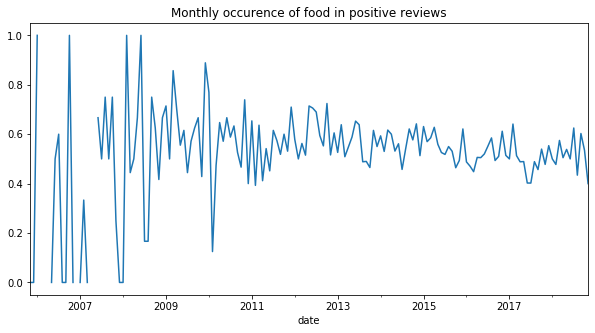

In [34]:
df_ch_woi_pos_ratio = df_ch_woi_pos_cnt.divide(df_ch_pos_cnt, fill_value=0.0)
df_ch_woi_pos_ratio.plot.line(rot=0, figsize=(10, 5), title="Monthly occurence of {} in positive reviews".format(woi))

#### Occurence ratio in negative reviews and plot

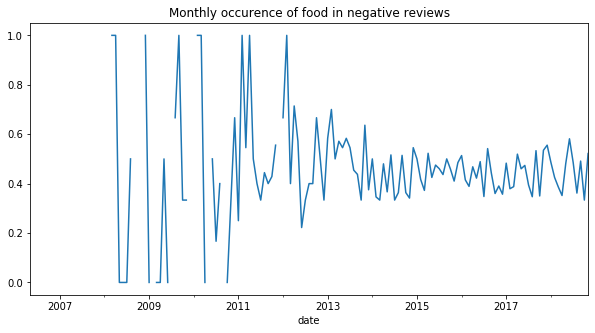

In [35]:
df_ch_woi_neg_ratio = df_ch_woi_neg_cnt.divide(df_ch_neg_cnt, fill_value=0.0)
df_ch_woi_neg_ratio.plot.line(rot=0, figsize=(10, 5), title="Monthly occurence of {} in negative reviews".format(woi))

# Examine All Frequent Words

In [36]:
def GetStarsInDateRange(x, start, end, colname):
    x_df = x.to_frame().reset_index('date')
    return x_df.loc[(x_df['date'] >= start) & (x_df['date'] <= end)].set_index('date')[colname]

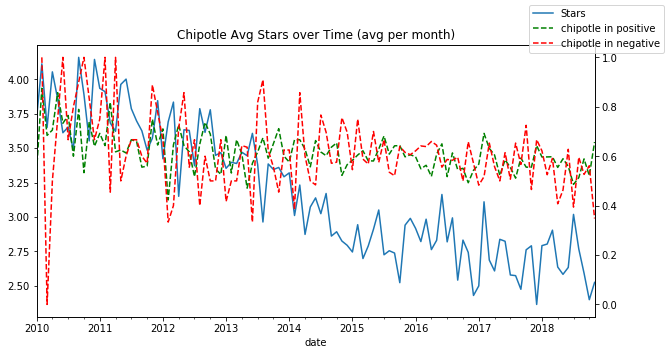

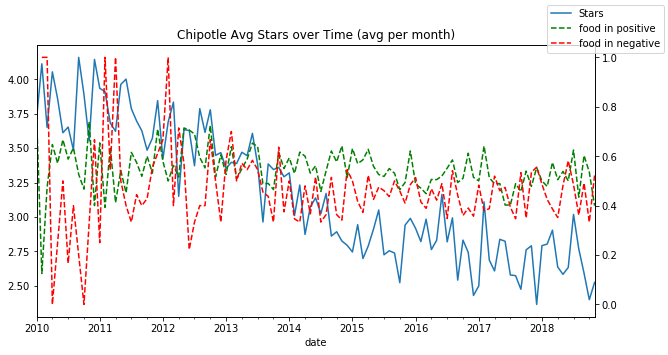

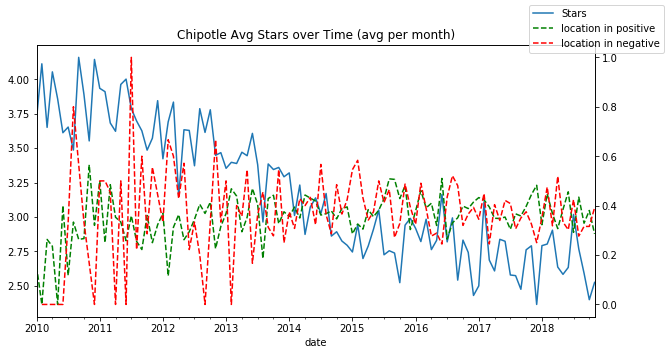

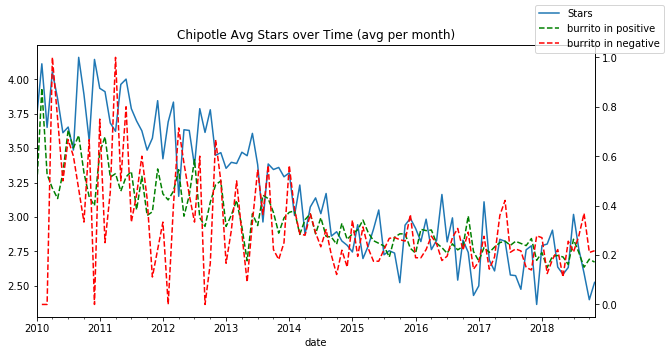

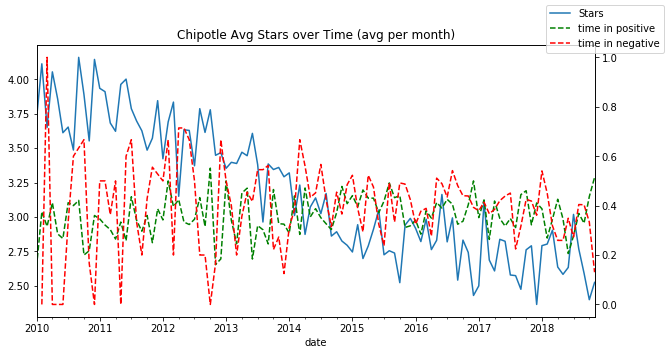

...

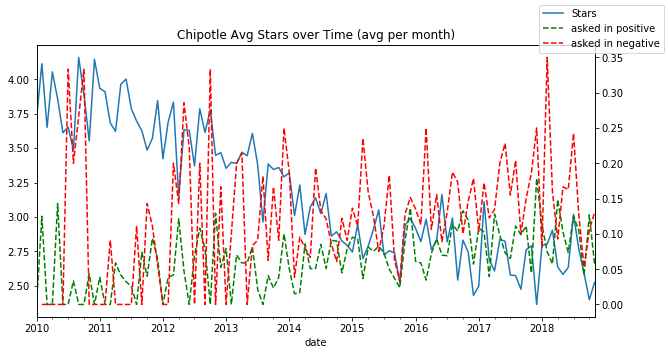

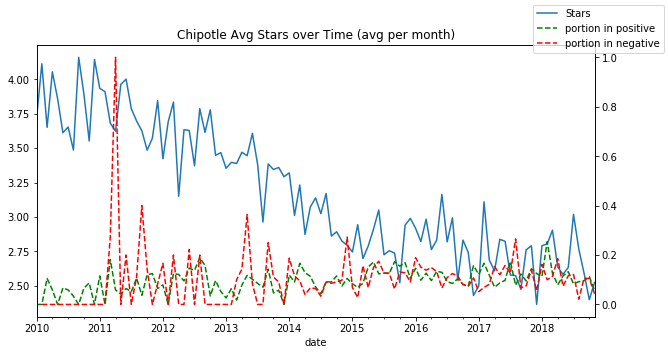

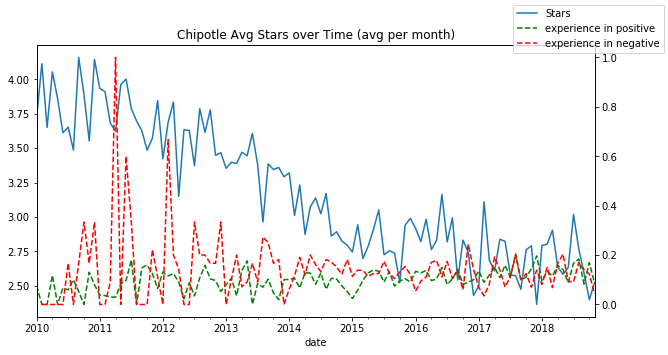

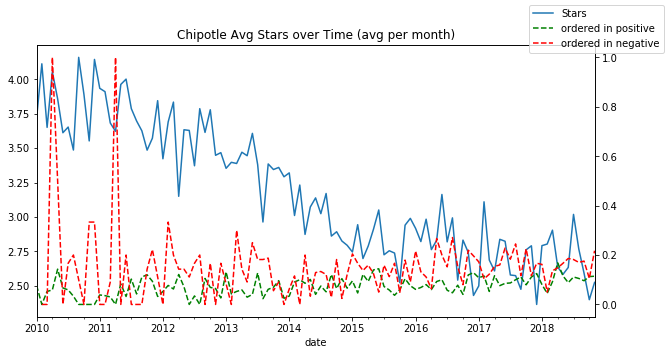

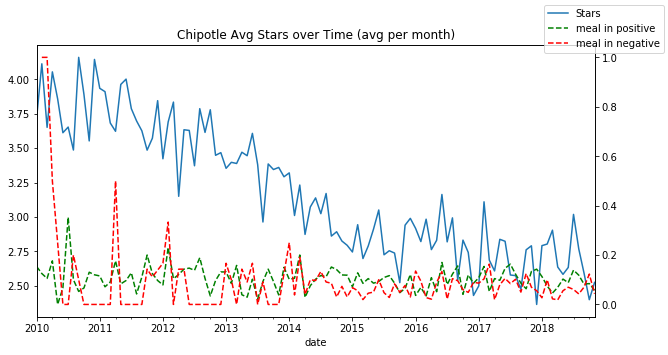

In [37]:
start_date = '2010-01-01'
end_date = '2018-12-31'

for woi in words:
    df_ch_woi = df_ch.loc[df_ch['text'].str.contains(woi)]
    df_ch_woi.head()
    df_ch_woi_pos_cnt = df_ch_woi.set_index('date').groupby('sentiment').get_group('positive').resample('M').count().sentiment
    df_ch_woi_neg_cnt = df_ch_woi.set_index('date').groupby('sentiment').get_group('negative').resample('M').count().sentiment

    fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    stars_plot = GetStarsInDateRange(ch_star_monthly_change, start_date, end_date, 'stars')
    stars_plot.plot.line(label='Stars', ax=ax, rot=0, figsize=(10, 5), title="Chipotle Avg Stars over Time (avg per month)", style='-')
    ax_r = ax.twinx()

    df_ch_woi_pos_ratio = df_ch_woi_pos_cnt.divide(df_ch_pos_cnt, fill_value=0.0)
    df_ch_woi_pos_ratio = df_ch_woi_pos_ratio.dropna()
    woi_pos_ratio_plot = GetStarsInDateRange(df_ch_woi_pos_ratio, start_date, end_date, 'sentiment')
    woi_pos_ratio_plot.plot.line(label='{} in positive'.format(woi), ax=ax_r, rot=0, style='g--')

    df_ch_woi_neg_ratio = df_ch_woi_neg_cnt.divide(df_ch_neg_cnt, fill_value=0.0)
    df_ch_woi_neg_ratio = df_ch_woi_neg_ratio.dropna()
    woi_neg_ratio_plot = GetStarsInDateRange(df_ch_woi_neg_ratio, start_date, end_date, 'sentiment')
    woi_neg_ratio_plot.plot.line(label='{} in negative'.format(woi), ax=ax_r, rot=0, style='r--')

    fig.legend()

In [38]:
words

['chipotle',
 'food',
 'location',
 'burrito',
 'time',
 'one',
 'order',
 'line',
 'bowl',
 'always',
 'service',
 'go',
 'good',
 'place',
 's',
 've',
 'chicken',
 'rice',
 'love',
 'staff',
 'm',
 'great',
 'customer',
 'back',
 'employee',
 'never',
 'people',
 'got',
 'meat',
 'really',
 'fast',
 'make',
 'eat',
 'friendly',
 'chip',
 'steak',
 'fresh',
 'even',
 'lunch',
 'minute',
 'bean',
 'salsa',
 'restaurant',
 'guacamole',
 'come',
 'asked',
 'portion',
 'experience',
 'ordered',
 'meal']

In [39]:
df_ch_woi_pos_cnt

date
2005-12-31     1
2006-01-31     0
2006-02-28     0
2006-03-31     0
2006-04-30     0
2006-05-31     0
2006-06-30     0
2006-07-31     0
2006-08-31     1
2006-09-30     0
2006-10-31     1
2006-11-30     0
2006-12-31     0
2007-01-31     0
2007-02-28     1
2007-03-31     1
2007-04-30     0
2007-05-31     0
2007-06-30     0
2007-07-31     0
2007-08-31     0
2007-09-30     0
2007-10-31     0
2007-11-30     0
2007-12-31     0
2008-01-31     0
2008-02-29     0
2008-03-31     1
2008-04-30     1
2008-05-31     1
              ..
2016-06-30    17
2016-07-31     7
2016-08-31    13
2016-09-30    12
2016-10-31     4
2016-11-30     8
2016-12-31     6
2017-01-31     8
2017-02-28    12
2017-03-31     4
2017-04-30     9
2017-05-31     9
2017-06-30    12
2017-07-31    15
2017-08-31    11
2017-09-30     7
2017-10-31     4
2017-11-30    12
2017-12-31     8
2018-01-31     7
2018-02-28     5
2018-03-31     4
2018-04-30     7
2018-05-31     8
2018-06-30     6
2018-07-31    10
2018-08-31     9
2018-09-3

# Word Clouds

In [25]:
# Create word frequency count
word2count = {}
for i in tqdm(range(len(Chipotle['review']))): 
    for word in Chipotle['review'].iloc[i].split():
        if word not in word2count.keys(): 
            word2count[word] = 1
        else: 
            word2count[word] += 1

100%|██████████| 9590/9590 [00:00<00:00, 28513.08it/s]


In [26]:
# Show the most frequent 200 words
freq_words = heapq.nlargest(200, word2count, key=word2count.get)
print(freq_words)

['not', 'chipotle', 'food', 'location', 'burrito', 'time', 'get', 'one', 'order', 'like', 'line', 'always', 'bowl', 'go', 'service', 'good', 'place', 'would', 'no', 'chicken', 'love', 'rice', 'staff', 's', 'great', 'customer', 'back', 'even', 'it', 'employee', 'never', 'people', 'got', 'really', 'meat', 'make', 'fast', 'eat', 'friendly', 'know', 'fresh', 'also', 'chip', 'steak', 'could', 'lunch', 'come', 'minute', 'bean', 'salsa', 'much', 'give', 'restaurant', 'guacamole', 'asked', 'want', 'portion', 'first', 'ever', 'ordered', 'experience', 'going', 'meal', 'wait', 'thing', 'way', 'well', 'went', 'taco', 'long', 'nice', 'pretty', 'say', 'said', 'extra', 'every', 'little', 'clean', 'better', 'bad', 'still', 'day', '2', 'there', 'here', 'work', 'made', 'put', 'manager', 'me', 'usually', 'online', 'right', '3', 'around', 'think', 'cheese', 'busy', 'u', 'star', 'take', 'two', 'need', 'lot', 'ask', 'today', 'last', 'ingredient', '5', 'everything', 'best', 'salad', 'quality', 'lettuce', 'an

In [27]:
# Remove meaningless words
a = ['1','2','3','4','5','6','7','8','9','10','one','two']
b = ['n','s','m','i']
c = ['it','in','ve','well','could','would','really','also','even','alway','always','still','never','much','thing']
# meaningless verbs
d = ['said','asked','did','love','go','got','do','make','know','think','come','going','put','went','seem','ordered','give','eat']
# nouns that appear so frequently that makes the comparison of two word clouds meaningless
e = ['chipotle','order']
# meaningless adjectives
f = ['good','great','pretty']
add_stopwords = a+b+c+d+e+f

# Add meaningless words into stopwords
for i in range(len(add_stopwords)):
    STOPWORDS.add(add_stopwords[i])

In [28]:
def wordcloud_draw(x, y):
    wordcloud = WordCloud(width=1600, height=800, random_state=1, max_words=200, background_color='white', stopwords=set(STOPWORDS))
    wordcloud.generate(str(set(x['review'])))
    # declare our figure 
    plt.figure(figsize=(15,8))
    plt.title(y, fontsize=40,color='Red')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout(pad=10)
    plt.show()

In [29]:
Chipotle_pos = pd.DataFrame(Chipotle['review'][Chipotle['sentiment'] == 'positive'])
Chipotle_neg = pd.DataFrame(Chipotle['review'][Chipotle['sentiment'] == 'negative'])

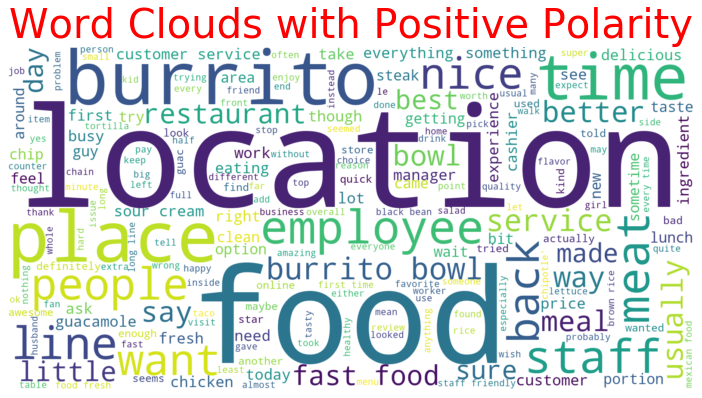

In [30]:
wordcloud_draw(Chipotle_pos, "Word Clouds with Positive Polarity")

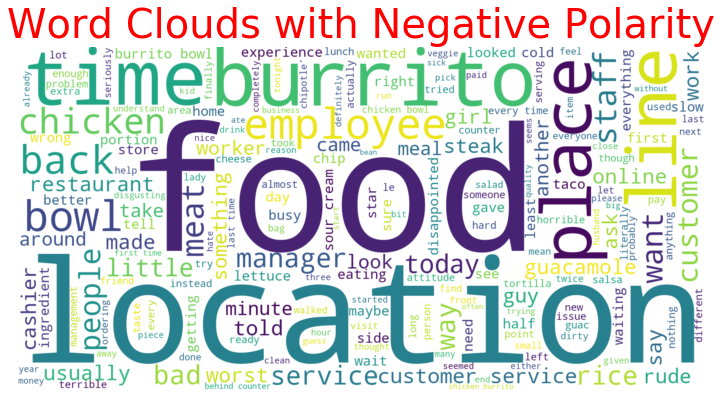

In [31]:
wordcloud_draw(Chipotle_neg, "Word Clouds with Negative Polarity")

# Topic Modeling

In [53]:
# tokenize each sentence into a list of words, removing punctuations
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(Chipotle['review']))

In [54]:
#Lemmatization
wnl = WordNetLemmatizer()
data_words = [[wnl.lemmatize(word) for word in sentence] for sentence in data_words]

In [55]:
# Remove Stop Words
stopwords = nltk.corpus.stopwords.words('english')

newStopWords =  ['no','nor','not',
                '1','2','3','4','5','6','7','8','9','10','one','two',
                 'n','s','m','i',
                 'it','in','ve','well','could','would','really','also','even','alway','always','still','never','much',
                 'thing','yet',
                 'said','asked','did','go','got','do','make','know','think','come','going','put','went','seem','ordered',
                 'give','eat','make','get',
                 'chipotle','guy']
stopwords.extend(newStopWords)

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stopwords] for doc in texts]

data_words = remove_stopwords(data_words)

In [56]:
#create bag-of-words for each narrative
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
# print(trigram_mod[bigram_mod[data_words[0]]])
print(bigram_mod[data_words[0]])

['regular', 'california', 'first', 'visit', 'la_vega', 'strip', 'pretty', 'new', 'place', 'took', 'veggie', 'bowl', 'rice', 'undone', 'fajitas', 'burnt', 'quantity', 'offered', 'le', 'usual', 'unhappy', 'place']


In [57]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [58]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words)
# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

[['regular', 'first', 'visit', 'strip', 'pretty', 'new', 'place', 'take', 'veggie', 'rice', 'undone', 'fajita', 'burn', 'quantity', 'offer', 'usual', 'unhappy', 'place']]


In [59]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
# print(corpus[:1])

# Finding the optimal number of topics Using LdaMallet model

In [60]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=1, step=1):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word,random_seed=101)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [61]:
# Can take a long time to run.
mallet_path = 'mallet-2.0.8/bin/mallet' # update this path
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=1, limit=12, step=1)

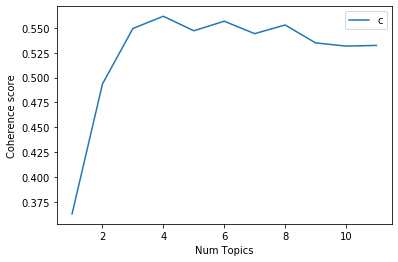

In [62]:
# Show graph
limit=12; start=1; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [63]:
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 1  has Coherence Value of 0.3629
Num Topics = 2  has Coherence Value of 0.4936
Num Topics = 3  has Coherence Value of 0.5493
Num Topics = 4  has Coherence Value of 0.5616
Num Topics = 5  has Coherence Value of 0.547
Num Topics = 6  has Coherence Value of 0.5566
Num Topics = 7  has Coherence Value of 0.5441
Num Topics = 8  has Coherence Value of 0.5528
Num Topics = 9  has Coherence Value of 0.5348
Num Topics = 10  has Coherence Value of 0.5316
Num Topics = 11  has Coherence Value of 0.5323


- Explanation for Perplexity:Perplexity is a measurement of how well a probability model predicts a test data.
- Low perplexity is good and high perplexity is bad since the perplexity is the exponentiation of the entropy (a measure of uncertainty or randomness).

# Finding topics Using LdaMallet model

In [65]:
# Select the model and print the topics
optimal_model = model_list[5]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.114*"time" + 0.097*"order" + 0.085*"line" + 0.044*"wait" + 0.042*"people" '
  '+ 0.028*"minute" + 0.027*"long" + 0.022*"online" + 0.016*"food" + '
  '0.015*"pick"'),
 (1,
  '0.049*"location" + 0.041*"staff" + 0.030*"lunch" + 0.030*"place" + '
  '0.029*"portion" + 0.028*"clean" + 0.027*"pretty" + 0.026*"good" + '
  '0.025*"nice" + 0.024*"friendly"'),
 (2,
  '0.039*"meat" + 0.037*"chicken" + 0.031*"bowl" + 0.027*"chip" + 0.026*"rice" '
  '+ 0.024*"guacamole" + 0.023*"extra" + 0.023*"steak" + 0.018*"serve" + '
  '0.017*"lettuce"'),
 (3,
  '0.115*"food" + 0.058*"good" + 0.051*"love" + 0.047*"great" + 0.040*"place" '
  '+ 0.039*"fast" + 0.033*"fresh" + 0.019*"ingredient" + 0.017*"quality" + '
  '0.016*"meal"'),
 (4,
  '0.069*"service" + 0.056*"location" + 0.049*"customer" + 0.044*"employee" + '
  '0.041*"bad" + 0.030*"experience" + 0.027*"work" + 0.024*"food" + '
  '0.015*"day" + 0.013*"visit"'),
 (5,
  '0.032*"back" + 0.023*"give" + 0.022*"pay" + 0.021*"manager" + 0.020*"make" '


# Finding the dominant topic in each Review

In [66]:
sent_topics_df = pd.DataFrame()
for i, row in enumerate(optimal_model[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = optimal_model.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)

In [67]:
sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']
df_dominant_topic = pd.concat([sent_topics_df, Chipotle], axis=1)
df_dominant_topic['year_month'] = df_dominant_topic['date'].dt.to_period('M')

# Show
df_dominant_topic.head()

,Dominant_Topic,Perc_Contribution,Topic_Keywords,business_id,city,state,stars_x,review_count,is_open,stars_y,...,cool,text,date,time,year,month,year_month,review,sentiment_socre,sentiment
0,2.0,0.2359,"meat, chicken, bowl, chip, rice, guacamole, ex...",dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,1.0,...,0,"I'm a regular at chipotle in California, this ...",2016-07-25,05:07:18,2016,7,2016-07,regular chipotle california first visit chipot...,-0.035606,negative
1,1.0,0.2877,"location, staff, lunch, place, portion, clean,...",dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,4.0,...,0,The food tasted the same as Chipotle back in m...,2012-09-10,15:44:21,2012,9,2012-09,food tasted chipotle back home state consisten...,0.189220,positive
2,2.0,0.2186,"meat, chicken, bowl, chip, rice, guacamole, ex...",dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,1.0,...,9,This is seriously the WORST chipotle I have ev...,2017-05-13,11:25:44,2017,5,2017-05,seriously worst chipotle ever coming year must...,-0.013686,negative
3,1.0,0.1971,"location, staff, lunch, place, portion, clean,...",dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,1.0,...,0,I am writing this based on my opinion before t...,2015-08-30,17:43:12,2015,8,2015-08,writing based opinion illness outbreak locatio...,0.060156,positive
4,1.0,0.1858,"location, staff, lunch, place, portion, clean,...",dusNIzdCaH6EoLl2hRy6cQ,Las Vegas,NV,3.5,115,1,3.0,...,0,"Convienient location, relatively decent food b...",2011-07-28,23:13:35,2011,7,2011-07,convienient location relatively decent food bo...,0.191667,positive


In [183]:
radar_list = df_dominant_topic.groupby(['Dominant_Topic'])['sentiment_socre'].mean()
topic_list =['time/line/wait/long','location/clean/nice/friendly','meat/chicken/chip/rice/guacamole/steak/lettuce',
           'fast/fresh/ingredient/quality', 'service/employee/bad','pay/manager/cashier']

radar_list

Dominant_Topic
0.0    0.035655
1.0    0.181740
2.0    0.014019
3.0    0.284053
4.0    0.008642
5.0    0.021478
Name: sentiment_socre, dtype: float64

In [184]:
radar_list =radar_list.apply(lambda x : x+0.1)

df = pd.DataFrame(dict(
    r=radar_list,
    theta=topic_list))
fig = px.line_polar(df, r='r', theta='theta', line_close=True,start_angle=90)
fig.show()

- 0: time/line/wait/long
- 1: location/clean/nice/friendly
- 2: meat/chicken/chip/rice/guacamole/steak/lettuce
- 3: fast/fresh/ingredient/quality
- 4: service/employee/bad
- 5: pay/manager/cashier

In [69]:
# just keep the rows from 2011.01 to 2018.10
df_dominant_topic = df_dominant_topic[(df_dominant_topic['year']>= 2011) & (df_dominant_topic['year_month']< '2018-11')]

In [70]:
pivot = pd.pivot_table(df_dominant_topic, index=['Dominant_Topic'],
                         columns=['year_month'],
                         values=['sentiment_socre'], 
                         aggfunc = np.mean, 
                         fill_value=0)

In [71]:
year_month_list = ['2011-01', '2011-02', '2011-03', '2011-04', '2011-05', '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11', '2011-12', '2012-01', '2012-02', '2012-03', '2012-04', '2012-05', 
 '2012-06', '2012-07', '2012-08', '2012-09', '2012-10', '2012-11', '2012-12', '2013-01', '2013-02', '2013-03', '2013-04', '2013-05', '2013-06', '2013-07', '2013-08', '2013-09', 
 '2013-10', '2013-11', '2013-12', '2014-01', '2014-02', '2014-03', '2014-04', '2014-05', '2014-06', '2014-07', '2014-08', '2014-09', '2014-10', '2014-11', '2014-12', '2015-01', 
 '2015-02', '2015-03', '2015-04', '2015-05', '2015-06', '2015-07', '2015-08', '2015-09', '2015-10', '2015-11', '2015-12', '2016-01', '2016-02', '2016-03', '2016-04', '2016-05', 
 '2016-06', '2016-07', '2016-08', '2016-09', '2016-10', '2016-11', '2016-12', '2017-01', '2017-02', '2017-03', '2017-04', '2017-05', '2017-06', '2017-07', '2017-08', '2017-09', 
 '2017-10', '2017-11', '2017-12', '2018-01', '2018-02', '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08', '2018-09', '2018-10']

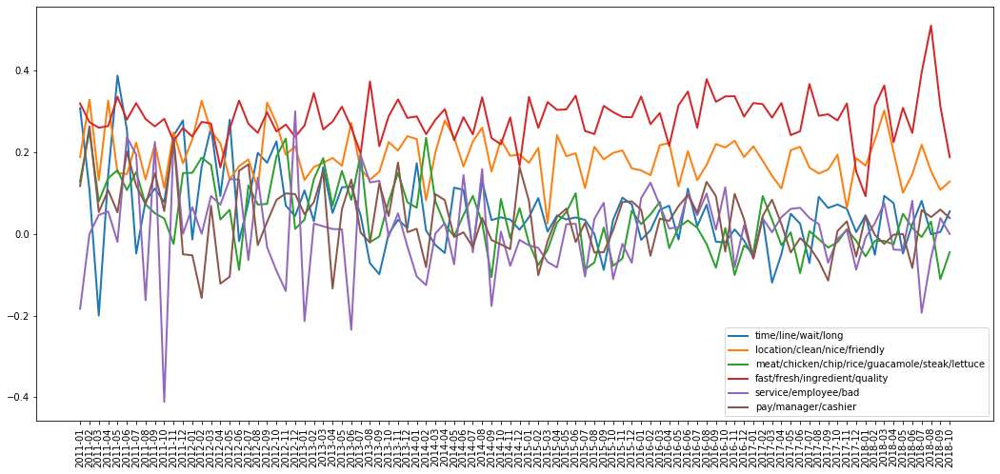

In [83]:
plt.figure(figsize=(18,8))
plt.plot(pivot.values[0], linewidth=2,label='time/line/wait/long')
plt.plot(pivot.values[1], linewidth=2,label='location/clean/nice/friendly')
plt.plot(pivot.values[2], linewidth=2,label="meat/chicken/chip/rice/guacamole/steak/lettuce")
plt.plot(pivot.values[3], linewidth=2,label='fast/fresh/ingredient/quality')
plt.plot(pivot.values[4], linewidth=2,label='service/employee/bad')
plt.plot(pivot.values[5], linewidth=2,label="pay/manager/cashier")
plt.xticks(np.arange(0, 94, 1.0))
locs, labels=plt.xticks()
x_ticks = list(np.arange(0, 94, 1.0))
new_xticks= year_month_list #['test' for d in locs]
plt.xticks(locs,new_xticks, rotation=90)

plt.legend()


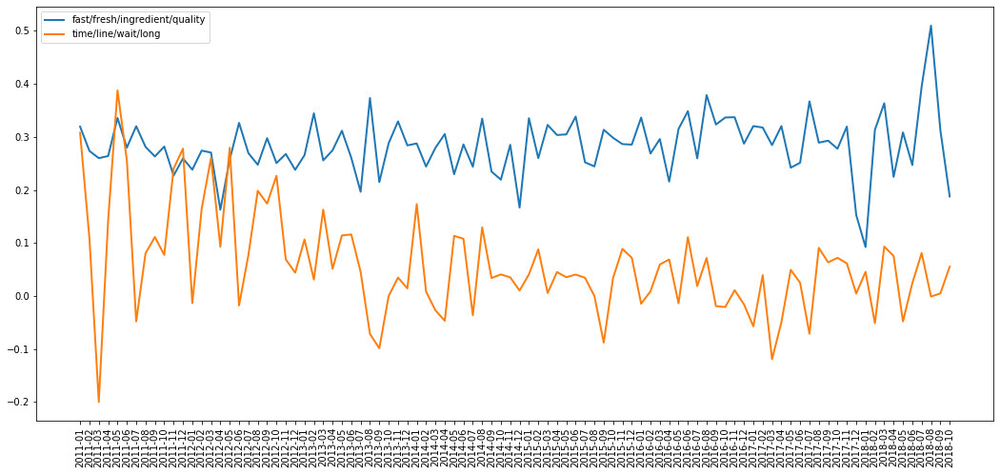

In [95]:
plt.figure(figsize=(18,8))
plt.plot(pivot.values[3], linewidth=2,label='fast/fresh/ingredient/quality')
plt.plot(pivot.values[0], linewidth=2,label='time/line/wait/long')
# plt.plot(pivot.values[2], linewidth=2,label="meat/chicken/chip/rice/guacamole/steak/lettuce")
# plt.plot(pivot.values[3], linewidth=2,label='fast/fresh/ingredient/quality')
plt.xticks(np.arange(0, 94, 1.0))
locs, labels=plt.xticks()
x_ticks = list(np.arange(0, 94, 1.0))
new_xticks= year_month_list #['test' for d in locs]
plt.xticks(locs,new_xticks, rotation=90)
plt.legend()

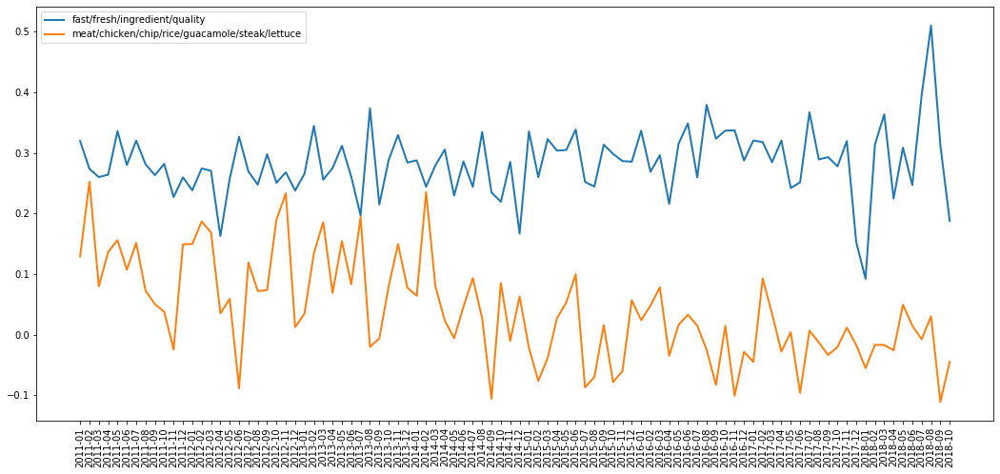

In [94]:
plt.figure(figsize=(18,8))
# plt.plot(pivot.values[0], linewidth=2,label='time/line/wait/long')
plt.plot(pivot.values[3], linewidth=2,label='fast/fresh/ingredient/quality')
plt.plot(pivot.values[2], linewidth=2,label="meat/chicken/chip/rice/guacamole/steak/lettuce")
plt.xticks(np.arange(0, 94, 1.0))
locs, labels=plt.xticks()
x_ticks = list(np.arange(0, 94, 1.0))
new_xticks= year_month_list #['test' for d in locs]
plt.xticks(locs,new_xticks, rotation=90)
plt.legend()